In [1]:
!pip install pytorch-msssim

In [3]:
import numpy as np
import warnings
warnings.filterwarnings('ignore')
import glob
from PIL import Image
import os
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import torch
from torch import nn, optim
import torch.nn.functional as F
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
import torchvision.datasets as dset
import torchvision.utils as vutils
from torchvision.utils import make_grid
import pandas as pd
from IPython.display import HTML
from tqdm.auto import tqdm
from torch.cuda.amp import GradScaler, autocast
from torch.nn.utils import spectral_norm as snorm
from pytorch_msssim import MS_SSIM

def is_cuda():
    if torch.cuda.is_available():
        print("CUDA available")
        return "cuda"
    else:
        print("No CUDA. Working on CPU.")
        return "cpu"
        
device = is_cuda()

CUDA available


In [4]:
root = "../input/lionkingscreenshots/"

batch_size = 8
image_size = 256
lr = 1e-4

In [5]:
def show_tensor_images(image_tensor, num_images=8, size=(3, 64, 64), nrow=4, figsize=8):

    image_tensor = (image_tensor + 1) / 2
    image_unflat = image_tensor.detach().cpu()
    image_grid = make_grid(image_unflat[:num_images], nrow=nrow)
    plt.figure(figsize=(figsize, figsize))
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()
    
def to_rgb(img):
    rgb_img = Image.new("RGB", img.size)
    rgb_img.paste(img)
    return rgb_img

class ImageSet(Dataset):
    def __init__(self, root, transform):
        self.transform = transform
        self.imgs = sorted(glob.glob(os.path.join(root, "*.*"))) # Only LionKing
        
    def __getitem__(self, index):
        img = Image.open(self.imgs[index % len(self.imgs)])
        img = to_rgb(img)
        img = self.transform(img)
        return img
    
    def __len__(self):
        return len(self.imgs)

transform = transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])


dataset = ImageSet(transform=transform, root="../input/lionkingscreenshots/")
dataloader = DataLoader(dataset, batch_size=8, shuffle=False)

In [6]:
class ResBlock(nn.Module):
    def __init__(self, channel):
        super().__init__()
        self.block = nn.Sequential(
            nn.utils.spectral_norm(nn.Conv2d(channel, channel, 3, 1, 1)),
            nn.BatchNorm2d(channel),
            nn.ReLU(),
            nn.utils.spectral_norm(nn.Conv2d(channel, channel, 3, 1, 1)),
            nn.BatchNorm2d(channel)
        )
        self.relu = nn.ReLU()
        
    def forward(self, x):
        res = x
        x = self.block(x)
        out = self.relu(res+x)
        return out
    
class SLE(nn.Module):
    def __init__(self, in_channel):
        super().__init__()
        self.block = nn.Sequential(
            nn.AdaptiveAvgPool2d(output_size=4),
            nn.utils.spectral_norm(nn.Conv2d(in_channel, in_channel, 4, 1, 0)),
            nn.LeakyReLU(0.1),
            nn.utils.spectral_norm(nn.Conv2d(in_channel, in_channel//8, 1, 1, 0)),
            nn.Sigmoid()
        )

    def forward(self, high, low):
        x = self.block(low)
        return high * x

class Decoder(nn.Module):
    def __init__(self, z_dim=128, out_res=256):
        super().__init__()
        assert out_res == 256, "Only Output Resolution of 256x256 Implemented, got {}".format(out_res)
        
        self.res1 = ResBlock(z_dim)
        
        self.block1 = nn.Sequential(
            nn.Upsample(scale_factor=2, mode='nearest'),
            nn.Conv2d(z_dim, z_dim//2, 3, 1, 1),
            nn.BatchNorm2d(z_dim//2),
            nn.ReLU()
        )
        
        self.res2 = ResBlock(z_dim//2)
        
        self.block2 = self.make_block(z_dim//2, z_dim//4)
        
        self.res3 = ResBlock(z_dim//4)
        
        self.block3 = self.make_block(z_dim//4, z_dim//8)
        
        self.sle = SLE(z_dim)
        
        self.out = nn.Sequential(
            nn.Conv2d(z_dim//8, 3, 3, 1, 1),
            nn.Tanh()
        )
#         self.skip1 = self.upsample(z_dim, z_dim//2)
#         self.skip2 = self.upsample(z_dim//2, z_dim//4)
        

    def make_block(self, in_channel, out_channel):
        block = nn.Sequential(
            nn.Upsample(scale_factor=2, mode='nearest'),
            nn.utils.spectral_norm(nn.Conv2d(in_channel, out_channel, 3, 1, 1)),
            nn.BatchNorm2d(out_channel),
            nn.ReLU()
        )
        return block
        
#     def upsample(self, in_channel, out_channel):
#         block = nn.Sequential(
#             nn.Upsample(scale_factor=2, mode='nearest'),
#             nn.utils.spectral_norm(nn.Conv2d(in_channel, out_channel, 1, 1, 0)),
#             nn.BatchNorm2d(out_channel),
#             nn.LeakyReLU(0.1)
#         )
#         return block
    
    def forward(self, x):      # 128 x 32 x 32
        h = self.res1(x)
        x = self.block1(x)
        x = self.res2(x)
        x = self.block2(x)
        x = self.res3(x)
        x = self.block3(x)
        x = self.sle(x, h)
        x = self.out(x)
        return x
    
class Encoder(nn.Module):
    def __init__(self, hidden_dim=128, in_res=256):
        super().__init__()
        assert in_res == 256, "Only Output Resolution of 256x256 Implemented, got {}".format(in_res)
                
        self.block1 = nn.Sequential(
            nn.utils.spectral_norm(nn.Conv2d(3, hidden_dim//4, 4, 2, 1)),
            nn.LeakyReLU(0.1),
            nn.utils.spectral_norm(nn.Conv2d(hidden_dim//4, hidden_dim//4, 3, 1, 1)),
            nn.BatchNorm2d(hidden_dim//4),
            nn.LeakyReLU(0.1)
        )
        
        self.res1 = ResBlock(hidden_dim//4)
        
        self.block2 = self.make_block(hidden_dim//4, hidden_dim//2)
        
        self.res2 = ResBlock(hidden_dim//2)
        
        self.block3 = self.make_block(hidden_dim//2, hidden_dim)
        
        self.res3 = ResBlock(hidden_dim)
        
#         self.skip1 = self.down_sample(hidden_dim//2, hidden_dim)


    def forward(self, x):
        x = self.block1(x) # 32 x 128 x 128
        x = self.res1(x)
        x = self.block2(x) # 64 x 64 x 64
        x = self.res2(x)
        x = self.block3(x) # 128 x 32 x 32
        x = self.res3(x)
        
        return x

    def make_block(self, in_channel, out_channel):
        block = nn.Sequential(
            nn.utils.spectral_norm(nn.Conv2d(in_channel, out_channel, 4, 2, 1)),
            nn.BatchNorm2d(out_channel),
            nn.LeakyReLU(0.1),
            nn.utils.spectral_norm(nn.Conv2d(out_channel, out_channel, 3, 1, 1)),
            nn.BatchNorm2d(out_channel),
            nn.LeakyReLU(0.1)
        )
        return block

    def down_sample(self, in_channel, out_channel):
        block = nn.Sequential(
            nn.AvgPool2d(2, 2),
            nn.utils.spectral_norm(nn.Conv2d(in_channel, out_channel, 1, 1, 0)),
            nn.BatchNorm2d(out_channel),
            nn.LeakyReLU(0.1)
        )
        return block
    
class AutoEncoder(nn.Module):
    def __init__(self, res=256, z_dim=128):
        super().__init__()
        self.encoder = Encoder(in_res=res, hidden_dim=z_dim) # Naming Mistake.........
        self.decoder = Decoder(out_res=res, z_dim=z_dim)     # Naming Mistake.........
        
    def forward(self, x):
        x = self.encoder(x) # 64 x 64 x 64
        x = self.decoder(x) # 3 x 256 x 256
        return x
    
    def encode(self, x):
        return self.encoder(x)
    
    def decode(self, x):
        return self.decoder(x)

In [7]:
class ResBlock3d(nn.Module):
    def __init__(self, channel):
        super().__init__()
        self.block = nn.Sequential(
            nn.utils.spectral_norm(nn.Conv3d(channel, channel, 3, 1, 1)),
            nn.BatchNorm3d(channel),
            nn.ReLU(),
            nn.utils.spectral_norm(nn.Conv3d(channel, channel, 3, 1, 1)),
            nn.BatchNorm3d(channel)
        )
        self.relu = nn.ReLU()
        
    def forward(self, x):
        res = x
        x = self.block(x)
        out = self.relu(res+x)
        return out

In [8]:
class Discriminator_V(nn.Module):
    def __init__(self, ndf):
        super().__init__()

        self.block1 = nn.Sequential(
            snorm(nn.Conv3d(3, ndf, 3, 1, 0)),
            nn.BatchNorm3d(ndf),
            nn.LeakyReLU(0.1)
        )
        self.res1 = ResBlock3d(ndf)
        self.block2 = nn.Sequential(
            snorm(nn.Conv3d(ndf, 2*ndf, 3, 1, 0)),
            nn.BatchNorm3d(2*ndf),
            nn.LeakyReLU(0.1)
        )
        self.res2 = ResBlock3d(2*ndf)
        self.out = nn.Conv3d(2*ndf, 1, 4, 1, 0)
        
        
    def forward(self, x):      # 8 x 3 x 256 x 256
        x = x.permute(1,0,2,3) # 3 x 8 x 256 x 256
        x = x.unsqueeze(0)     # 1 x 3 x 8 x 256 x 256
        x = self.block1(x)
        x = self.res1(x)
        x = self.block2(x)
        x = self.res2(x)
        x = self.out(x)       # 1 x 1 x 1 x 250 x 250
        return x

# Pix2Pix

In [9]:
def weights_init_normal(m):
    classname = m.__class__.__name__
    if classname.find("Conv") != -1:
        torch.nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find("BatchNorm2d") != -1:
        torch.nn.init.normal_(m.weight.data, 1.0, 0.02)
        torch.nn.init.constant_(m.bias.data, 0.0)

In [10]:
class UNetDown(nn.Module):
    def __init__(self, in_size, out_size, normalize=True, dropout=0.0):
        super(UNetDown, self).__init__()
        layers = [snorm(nn.Conv2d(in_size, out_size, 4, 2, 1, bias=False))]
        if normalize:
            layers.append(nn.InstanceNorm2d(out_size))
        layers.append(nn.LeakyReLU(0.2))
        if dropout:
            layers.append(nn.Dropout(dropout))
        self.model = nn.Sequential(*layers)

    def forward(self, x):
        return self.model(x)


class UNetUp(nn.Module):
    def __init__(self, in_size, out_size, dropout=0.0):
        super(UNetUp, self).__init__()
        layers = [
            snorm(nn.ConvTranspose2d(in_size, out_size, 4, 2, 1, bias=False)),
            nn.InstanceNorm2d(out_size),
            nn.ReLU(inplace=True),
        ]
        if dropout:
            layers.append(nn.Dropout(dropout))

        self.model = nn.Sequential(*layers)

    def forward(self, x, skip_input):
        x = self.model(x)
        x = torch.cat((x, skip_input), 1)

        return x


class GeneratorUNet(nn.Module):
    def __init__(self, in_channels=3, out_channels=3):
        super(GeneratorUNet, self).__init__()

        self.down1 = UNetDown(in_channels, 64, normalize=False)
        self.down2 = UNetDown(64, 128)
        self.down3 = UNetDown(128, 256)
        self.down4 = UNetDown(256, 512, dropout=0.5)
        self.down5 = UNetDown(512, 512, dropout=0.5)
        self.down6 = UNetDown(512, 512, normalize=False, dropout=0.5)

        self.up1 = UNetUp(512, 512, dropout=0.5)
        self.up2 = UNetUp(1024, 512, dropout=0.5)
        self.up3 = UNetUp(1024, 256)
        self.up4 = UNetUp(512, 128)
        self.up5 = UNetUp(256, 64)

        self.final = nn.Sequential(
            nn.Upsample(scale_factor=2),
            nn.ZeroPad2d((1, 0, 1, 0)),
            nn.Conv2d(128, out_channels, 4, padding=1),
            nn.Tanh(),
        )

    def forward(self, x):
        # U-Net generator with skip connections from encoder to decoder
        d1 = self.down1(x)
        d2 = self.down2(d1)
        d3 = self.down3(d2)
        d4 = self.down4(d3)
        d5 = self.down5(d4)
        d6 = self.down6(d5)
        u1 = self.up1(d6, d5)
        u2 = self.up2(u1, d4)
        u3 = self.up3(u2, d3)
        u4 = self.up4(u3, d2)
        u5 = self.up5(u4, d1)

        return self.final(u5)


##############################
#        Discriminator
##############################


class Discriminator(nn.Module):
    def __init__(self, in_channels=3):
        super(Discriminator, self).__init__()

        def discriminator_block(in_filters, out_filters, normalization=True):
            """Returns downsampling layers of each discriminator block"""
            layers = [snorm(nn.Conv2d(in_filters, out_filters, 4, stride=2, padding=1))]
            if normalization:
                layers.append(nn.InstanceNorm2d(out_filters))
            layers.append(nn.LeakyReLU(0.2, inplace=True))
            return layers

        self.model = nn.Sequential(
            *discriminator_block(in_channels * 2, 64, normalization=False),
            *discriminator_block(64, 128),
            *discriminator_block(128, 256),
            *discriminator_block(256, 512),
            nn.ZeroPad2d((1, 0, 1, 0)),
            nn.Conv2d(512, 1, 4, padding=1, bias=False)
        )

    def forward(self, img_A, img_B):
        # Concatenate image and condition image by channels to produce input
        img_input = torch.cat((img_A, img_B), 1)
        return self.model(img_input)

In [27]:
G = AutoEncoder()
D_V = Discriminator_V(ndf=32)
G.to(device)
D_V.to(device)
R = GeneratorUNet()
D = Discriminator()
R.apply(weights_init_normal)
D.apply(weights_init_normal)
# G.load_state_dict(torch.load("../input/project-ae/model.pt"))

Discriminator(
  (model): Sequential(
    (0): Conv2d(6, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (3): InstanceNorm2d(128, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (6): InstanceNorm2d(256, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (9): InstanceNorm2d(512, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): ZeroPad2d(padding=(1, 0, 1, 0), value=0.0)
    (12): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), padding=(1, 1), bias=False)
  )
)

In [28]:
R.to(device)
D.to(device)

Discriminator(
  (model): Sequential(
    (0): Conv2d(6, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (3): InstanceNorm2d(128, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (6): InstanceNorm2d(256, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (9): InstanceNorm2d(512, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): ZeroPad2d(padding=(1, 0, 1, 0), value=0.0)
    (12): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), padding=(1, 1), bias=False)
  )
)

In [29]:
g_optim = optim.Adam(G.parameters(), lr=lr, betas=(0.5, 0.999))
dv_optim = optim.Adam(D_V.parameters(), lr=5*lr, betas=(0.5, 0.999))
r_optim = optim.Adam(R.parameters(), lr=lr, betas=(0.5, 0.999))
d_optim = optim.Adam(D.parameters(), lr=5*lr, betas=(0.5, 0.999))

In [30]:
adv_loss = nn.BCEWithLogitsLoss()
recon_loss = nn.L1Loss()
ssim_loss = MS_SSIM(data_range=1, size_average=True)

dv_losses = []
d_losses = []
g_losses = []
r_losses = []

idx = np.load("../input/capture-io-2/lion-indices.npy")

In [31]:
!nvidia-smi

Fri Feb 19 02:42:09 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 450.51.06    Driver Version: 450.51.06    CUDA Version: 11.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   65C    P0    40W / 250W |   3743MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [32]:
num_iters = 9000
show_iters= 50

  0%|          | 0/4500 [00:00<?, ?it/s]

50 / 9000, D_V_loss: 0.7536, G_loss: 3.8275, 


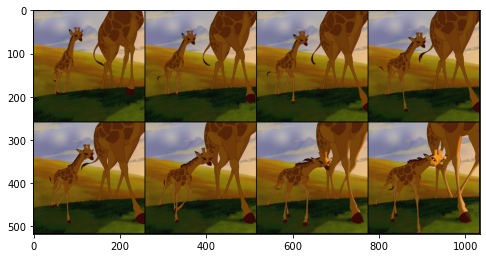

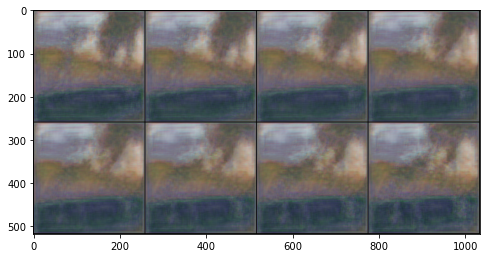

100 / 9000, D_V_loss: 0.4788, G_loss: 3.7798, 


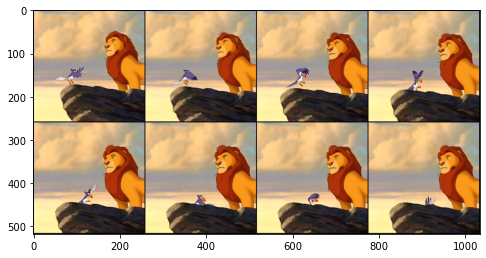

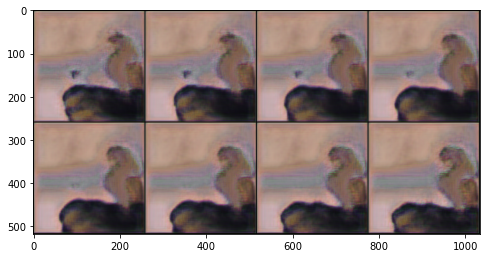

150 / 9000, D_V_loss: 0.5404, G_loss: 3.0792, 


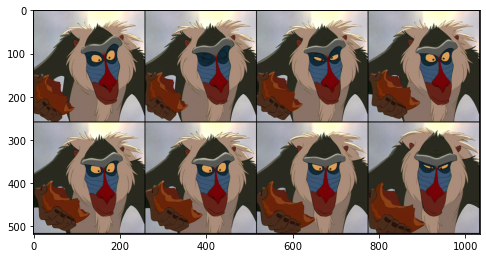

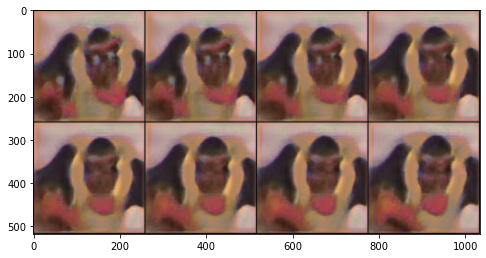

200 / 9000, D_V_loss: 0.6563, G_loss: 4.3733, 


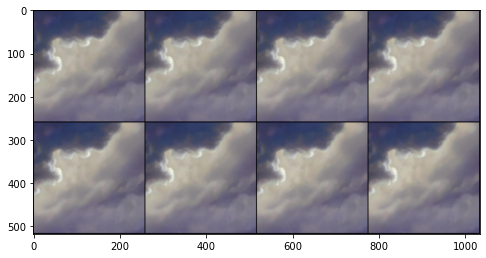

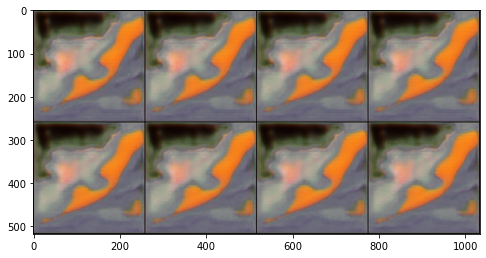

250 / 9000, D_V_loss: 0.7083, G_loss: 2.4768, 


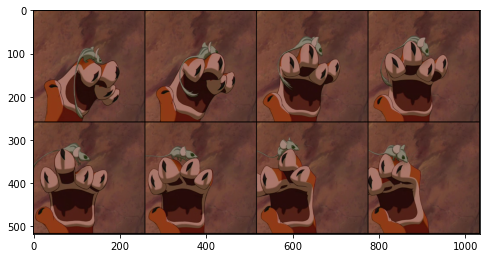

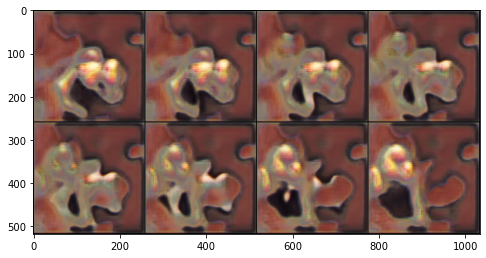

300 / 9000, D_V_loss: 0.5095, G_loss: 3.3072, 


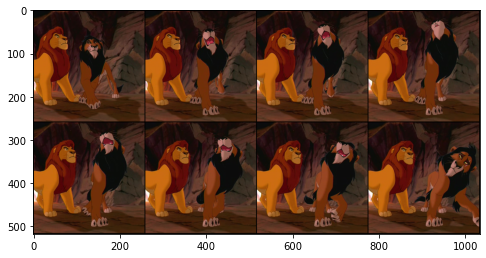

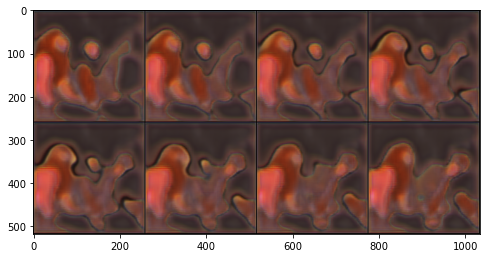

350 / 9000, D_V_loss: 0.6513, G_loss: 2.5754, 


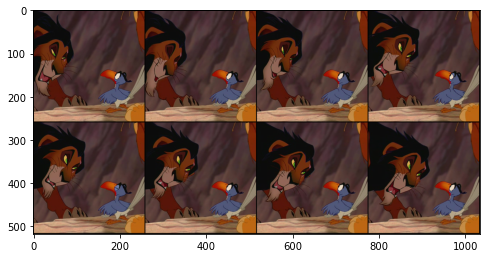

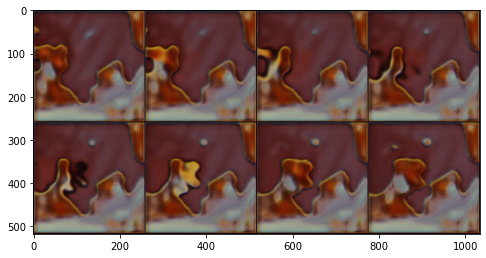

400 / 9000, D_V_loss: 0.6541, G_loss: 4.6216, 


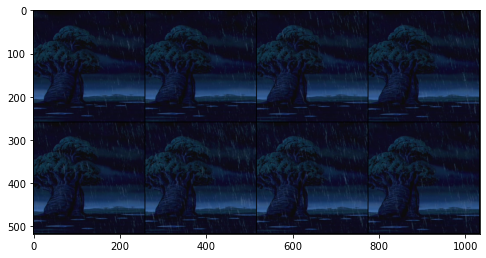

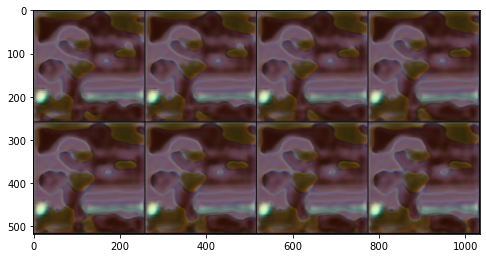

450 / 9000, D_V_loss: 0.6312, G_loss: 2.6523, 


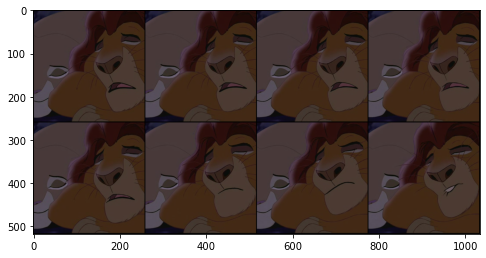

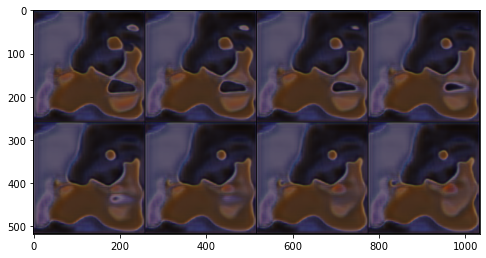

500 / 9000, D_V_loss: 0.2219, G_loss: 6.9240, 


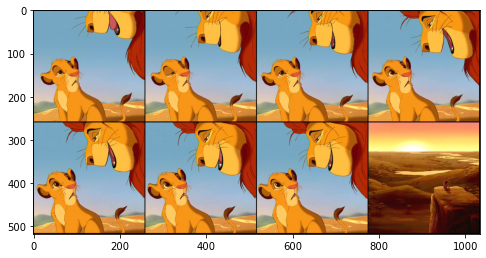

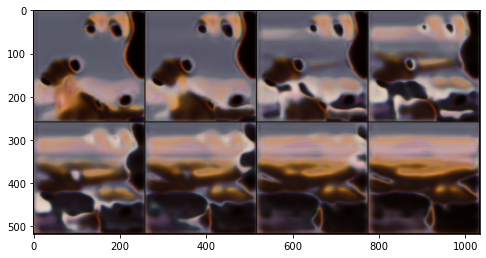

550 / 9000, D_V_loss: 0.5248, G_loss: 5.4159, 


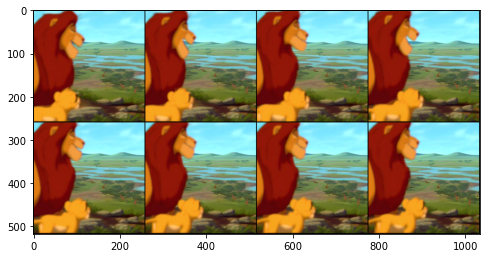

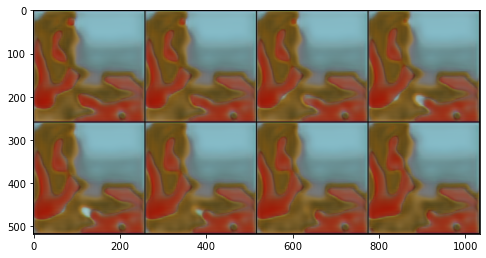

600 / 9000, D_V_loss: 0.2143, G_loss: 5.7196, 


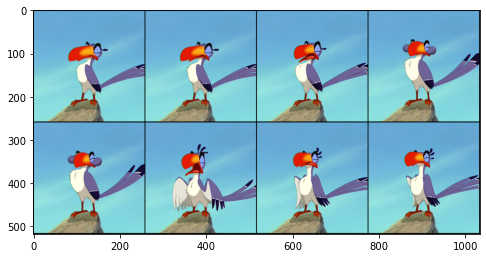

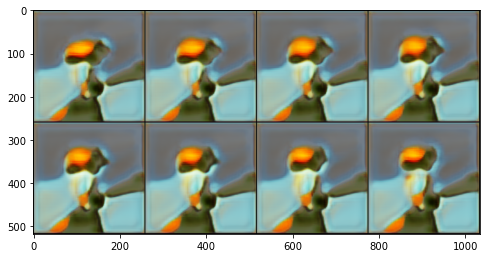

650 / 9000, D_V_loss: 0.9459, G_loss: 3.3400, 


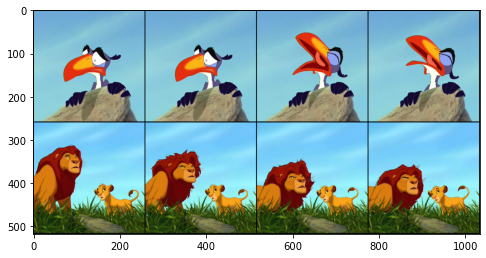

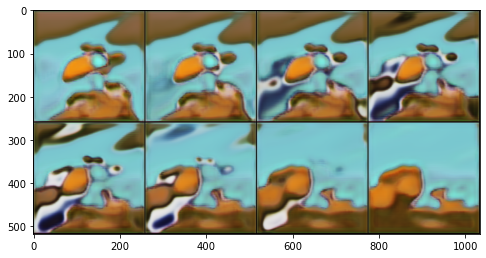

700 / 9000, D_V_loss: 0.6179, G_loss: 3.0948, 


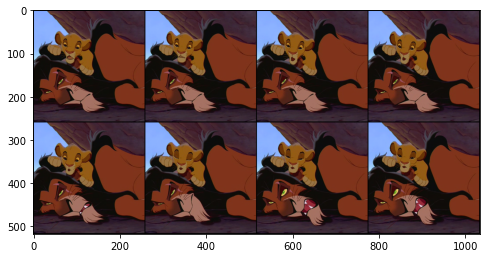

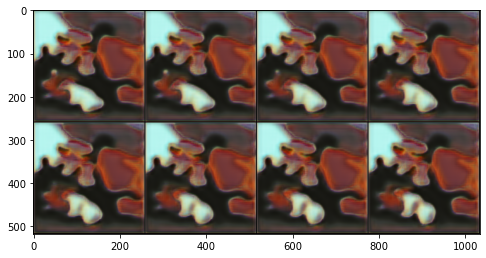

750 / 9000, D_V_loss: 0.5267, G_loss: 2.8903, 


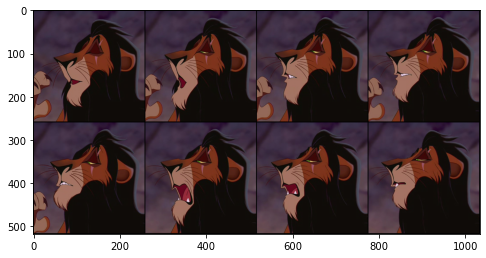

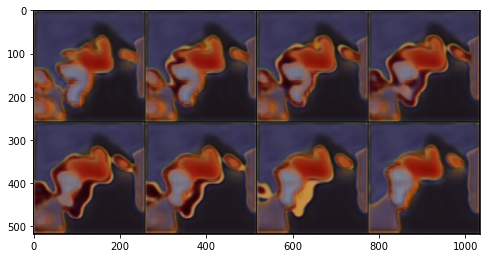

850 / 9000, D_V_loss: 0.4309, G_loss: 5.2713, 


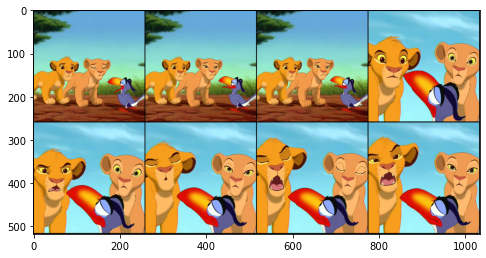

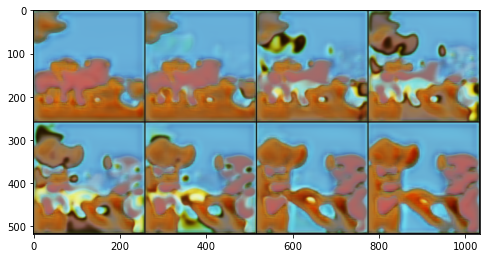

900 / 9000, D_V_loss: 0.5371, G_loss: 4.7688, 


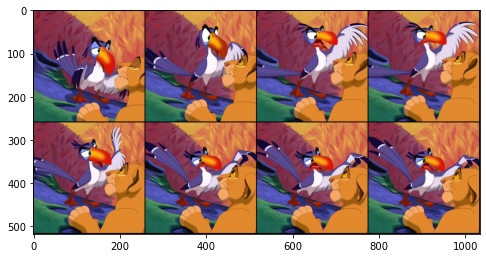

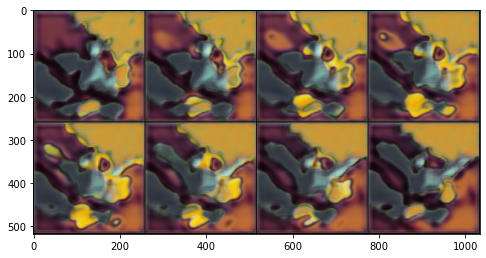

950 / 9000, D_V_loss: 0.5187, G_loss: 4.2024, 


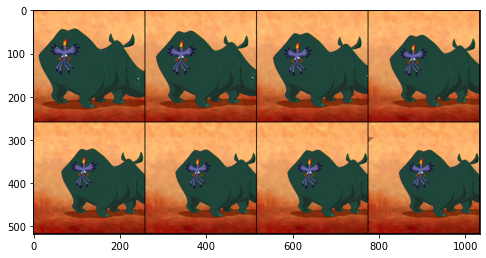

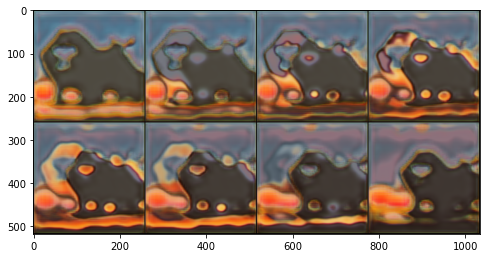

1050 / 9000, D_V_loss: 0.6069, G_loss: 4.5972, 


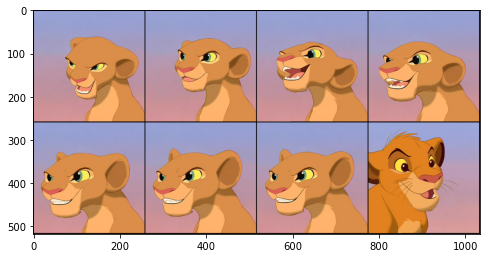

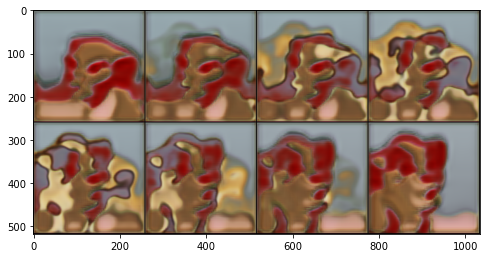

1150 / 9000, D_V_loss: 0.9430, G_loss: 3.9053, 


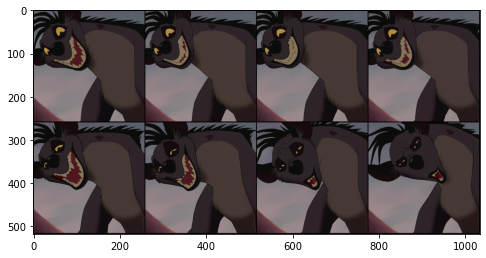

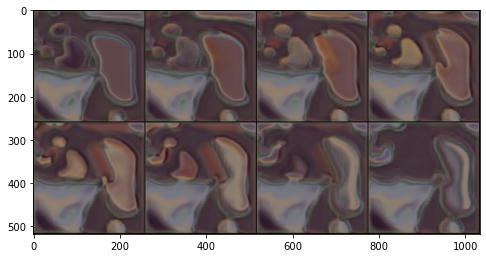

1250 / 9000, D_V_loss: 0.7047, G_loss: 4.8776, 


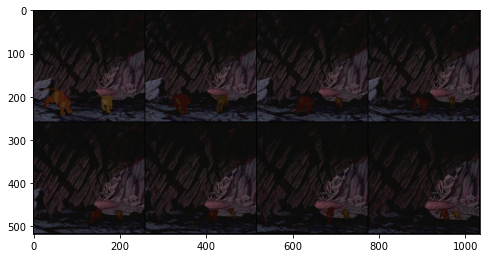

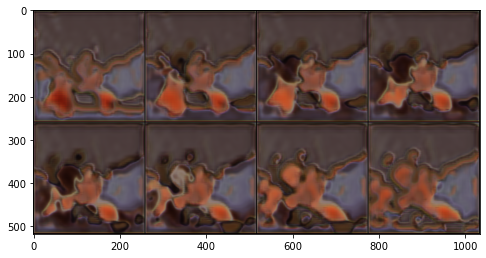

1300 / 9000, D_V_loss: 0.3587, G_loss: 2.4931, 


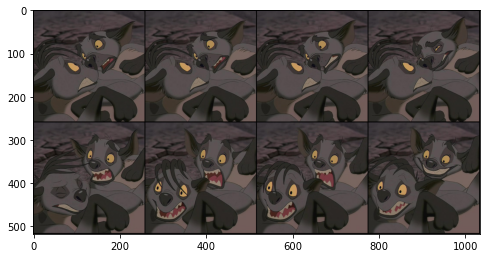

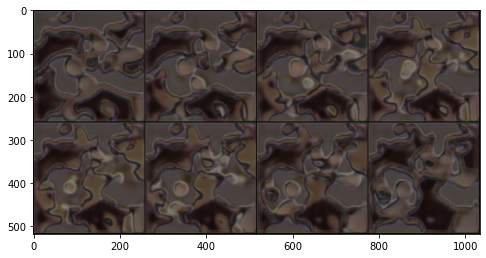

1350 / 9000, D_V_loss: 1.9454, G_loss: 4.9051, 


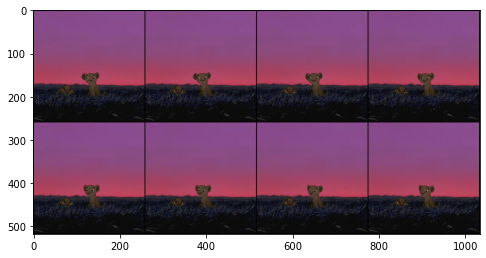

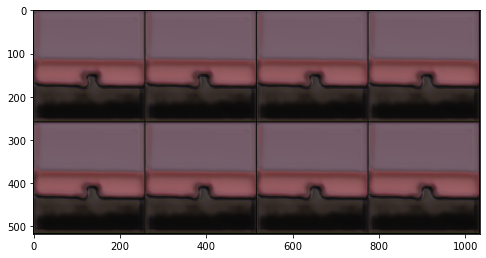

1400 / 9000, D_V_loss: 0.3137, G_loss: 3.0072, 


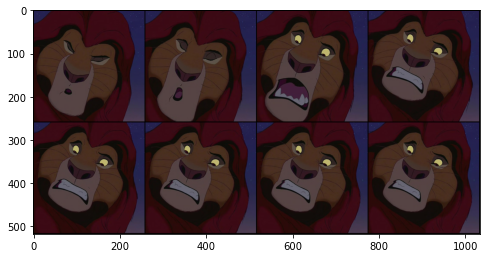

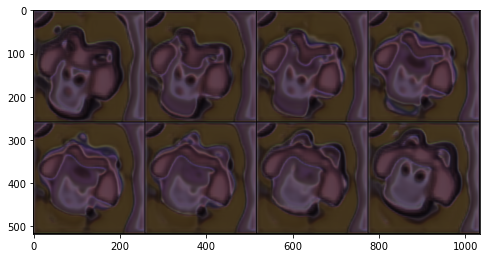

1450 / 9000, D_V_loss: 0.6053, G_loss: 2.0197, 


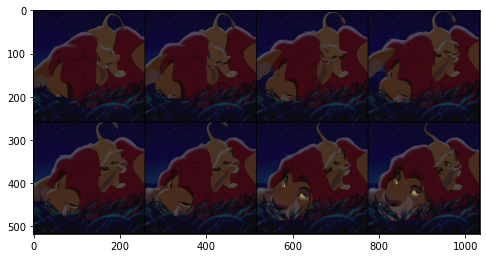

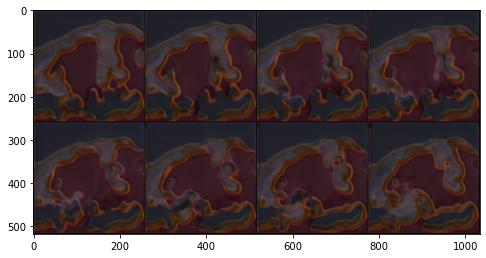

1550 / 9000, D_V_loss: 0.1744, G_loss: 3.9599, 


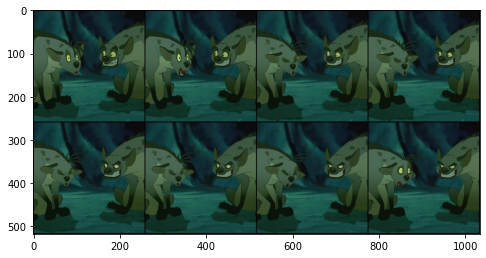

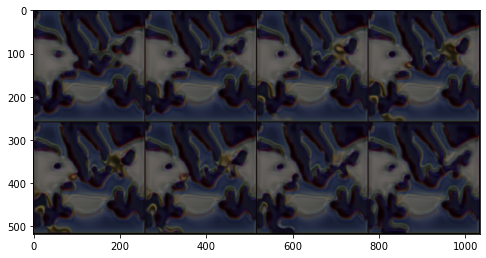

1600 / 9000, D_V_loss: 0.6912, G_loss: 2.6564, 


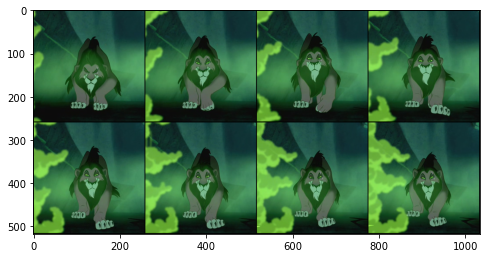

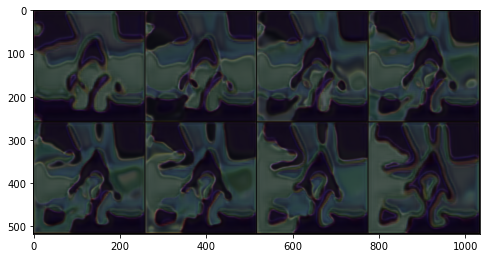

1650 / 9000, D_V_loss: 0.5680, G_loss: 2.8532, 


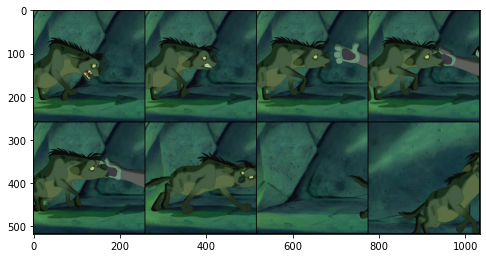

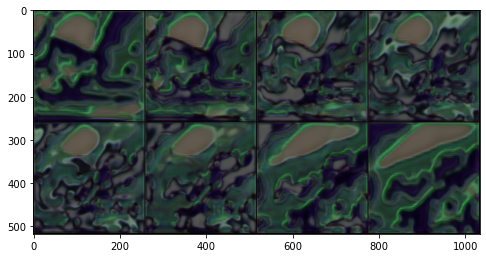

1700 / 9000, D_V_loss: 0.6076, G_loss: 4.9996, 


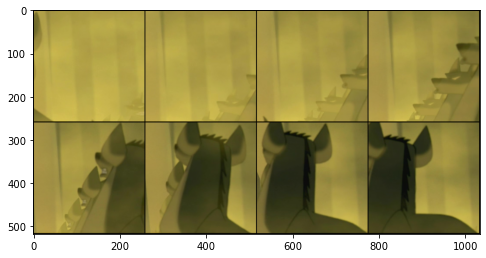

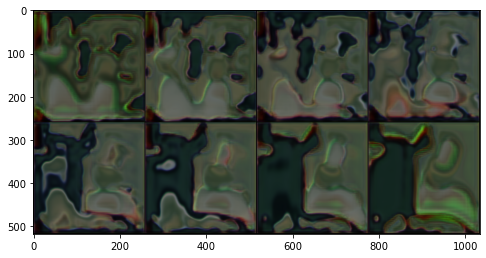

1750 / 9000, D_V_loss: 0.3142, G_loss: 5.1258, 


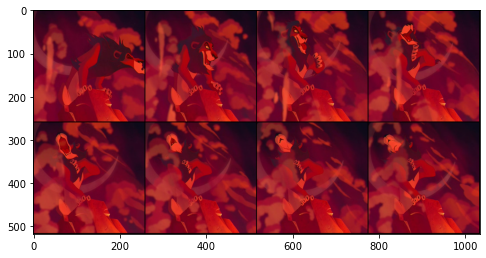

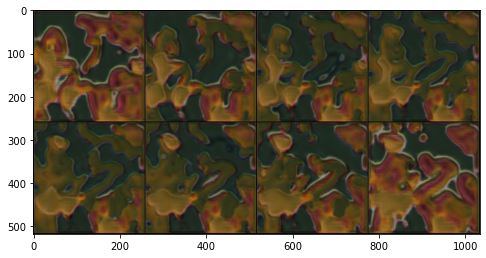

1800 / 9000, D_V_loss: 0.0898, G_loss: 8.7119, 


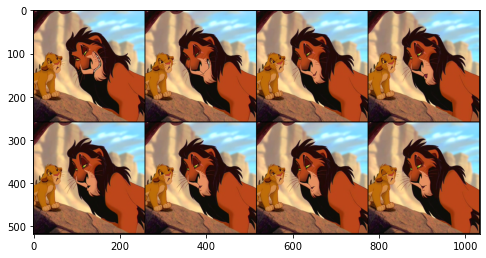

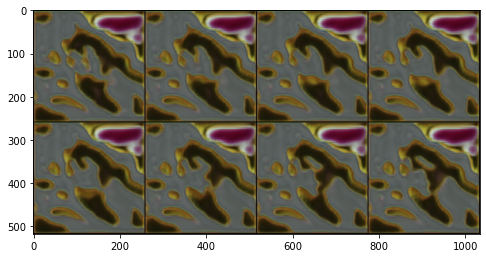

KeyboardInterrupt: 

In [33]:
cur_iter = 0

while True:
    t = 0
    for data in tqdm(dataloader):
        t += 1
        cur_iter += 1
        if t-1 in idx:
            continue

        data = data.to(device)
        dv_optim.zero_grad()

        z1 = data[0].unsqueeze(0).cuda()
        z2 = data[-1].unsqueeze(0).cuda()
        z1 = G.encode(z1)
        z2 = G.encode(z2)
        zs = torch.cat([torch.lerp(z1, z2, v) for v in np.linspace(0, 1, 8)]).cuda()
        fake = G.decode(zs)

        d_pred_real = D_V(data)
        real_labels = torch.ones_like(d_pred_real)
        d_pred_fake = D_V(fake)
        fake_labels = torch.zeros_like(d_pred_fake)
        d_real_loss = adv_loss(d_pred_real, real_labels)
        d_fake_loss = adv_loss(d_pred_fake, fake_labels)
        dv_loss = 0.5 * (d_real_loss + d_fake_loss)
        dv_losses.append(dv_loss.item())
        dv_loss.backward()
        dv_optim.step()

        g_optim.zero_grad()
        recon = G(data)
        z1 = data[0].unsqueeze(0).cuda()
        z2 = data[-1].unsqueeze(0).cuda()
        z1 = G.encode(z1)
        z2 = G.encode(z2)
        zs = torch.cat([torch.lerp(z1, z2, v) for v in np.linspace(0, 1, 8)]).cuda()
        fake = G.decode(zs)

        d_pred_fake_v = D_V(fake)
        real_labels = torch.ones_like(d_pred_fake_v)
        g_adv_loss = adv_loss(d_pred_fake_v, real_labels)
        g_ssim_loss = ssim_loss(fake, data)
        g_recon_loss = recon_loss(recon, data)
        g_loss = 0.1*g_ssim_loss + g_adv_loss + 10*g_recon_loss
        g_losses.append(g_loss.item())
        g_loss.backward()
        g_optim.step()
        

        if (cur_iter) % show_iters == 0:
            print("{} / {}, D_V_loss: {:.4f}, G_loss: {:.4f}, ".format(cur_iter, num_iters, 
                                                                        dv_loss.item(), g_loss.item()))
            show_tensor_images(data.float())
            show_tensor_images(fake.float())
#                 imgs_list.append(model(fixed).detach().cpu())

            torch.save(G.state_dict(), "G.pt")
            torch.save(D_V.state_dict(), "D_V.pt")


        del fake, dv_loss, g_loss, d_pred_real, d_pred_fake
        torch.cuda.empty_cache()
        
        if cur_iter >= num_iters:
            break

    if cur_iter >= num_iters:
        break

In [35]:
num_iters = 13500
show_iters = 150

  0%|          | 0/4500 [00:00<?, ?it/s]

150 / 13500, D_loss: 0.6153, R_loss: 16.3255, 


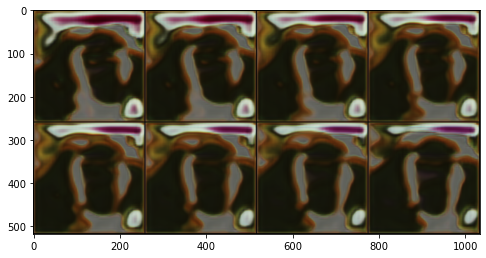

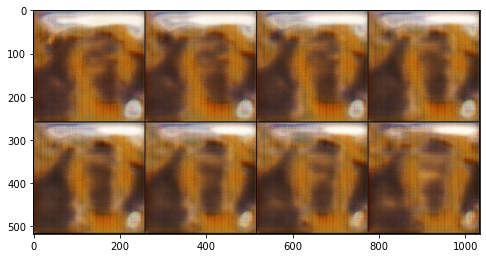

300 / 13500, D_loss: 0.5107, R_loss: 9.2827, 


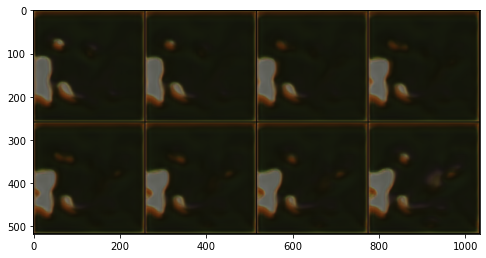

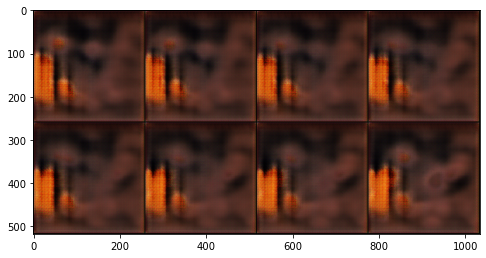

450 / 13500, D_loss: 0.6808, R_loss: 5.8794, 


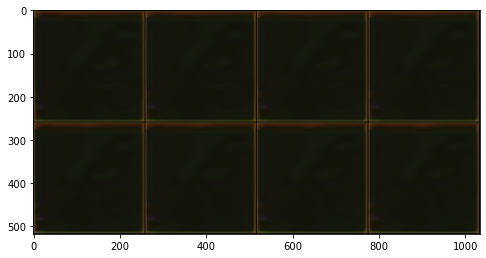

In [ ]:
cur_iter = 0

G.eval()

while True:
    t = 0
    for data in tqdm(dataloader):
        t += 1
        cur_iter += 1
        if t-1 in idx:
            continue

        data = data.to(device)
        
        d_optim.zero_grad()
        z1 = data[0].unsqueeze(0).cuda()
        z2 = data[-1].unsqueeze(0).cuda()
        z1 = G.encode(z1)
        z2 = G.encode(z2)
        zs = torch.cat([torch.lerp(z1, z2, v) for v in np.linspace(0, 1, 8)]).cuda()
        fake = G.decode(zs)
        d_pred_real = D(data, fake)
        real_labels = torch.ones_like(d_pred_real)
        refined = R(fake)
        d_pred_fake = D(refined, fake)
        fake_labels = torch.zeros_like(d_pred_fake)
        d_real_loss = adv_loss(d_pred_real, real_labels)
        d_fake_loss = adv_loss(d_pred_fake, fake_labels)
        d_loss = 0.5 * (d_real_loss + d_fake_loss)
        d_losses.append(d_loss.item())
        d_loss.backward(retain_graph=True)
        d_optim.step()

        r_optim.zero_grad()
        refined = R(fake)
        d_pred_fake = D(refined, fake)
        real_labels = torch.ones_like(d_pred_real)
        r_adv_loss = adv_loss(d_pred_fake, real_labels)
        r_recon_loss = recon_loss(refined, data)
        r_loss = 0.5*(r_adv_loss + 100*r_recon_loss)
        r_losses.append(r_loss.item())
        r_loss.backward()
        r_optim.step()
        
        if (cur_iter) % show_iters == 0:
            print("{} / {}, D_loss: {:.4f}, R_loss: {:.4f}, ".format(cur_iter, num_iters, 
                                                                        d_loss.item(), r_loss.item()))
            
            show_tensor_images(data.float())
            show_tensor_images(fake.float())
            show_tensor_images(refined.float())
#                 imgs_list.append(model(fixed).detach().cpu())

            torch.save(D.state_dict(), "D.pt")
            torch.save(R.state_dict(), "R.pt")

        del fake, d_loss, r_loss, d_pred_real, d_pred_fake
        torch.cuda.empty_cache()
        
        if cur_iter >= num_iters:
            break

    if cur_iter >= num_iters:
        break

In [ ]:
# num_iters = 6000
# show_iters = 200

# train(num_iters=num_iters, show_iter=show_iters)

In [ ]:
G.eval()
R.eval()

imgs = []

idx = np.load("../input/capture-io-2/lion-indices.npy")

dataloader = DataLoader(dataset, batch_size=8, shuffle=False)

t = 0
for data in dataloader:
    t += 1
    if t-1 in idx:
        continue
    z1 = data[0].unsqueeze(0).cuda()
    z2 = data[-1].unsqueeze(0).cuda()
    z1 = G.encode(z1)
    z2 = G.encode(z2)
    zs = torch.cat([torch.lerp(z1, z2, v) for v in np.linspace(0.1, 1, 16)]).cuda()
    zs = G.decode(zs)
    out = R(zs)
#     show_tensor_images(model(zs), num_images=9, nrow=9, figsize=16)
    for i in range(len(out)):
        imgs.append(out[i].detach().cpu())
    
    if t >= 200:
        break
        
len(imgs)

In [ ]:
fig = plt.figure(figsize=(5,5))
plt.axis("off")
ims = [[plt.imshow(np.transpose((i+1)/2,(1,2,0)), animated=True)] for i in imgs]
ani = animation.ArtistAnimation(fig, ims, interval=100, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

In [ ]:
# imgs = []
# n_epochs = 5
# idx = np.load("../input/capture-io-2/lion-indices.npy")
# recon_loss = nn.L1Loss()

# t = 0
# for _ in range(n_epochs):
#     for data in tqdm(dataloader):
#         data = data.cuda()
#         optimizer.zero_grad()
#         t += 1
#         if t-1 in idx:
#             continue
#         z1 = data[0].unsqueeze(0).cuda()
#         z2 = data[-1].unsqueeze(0).cuda()
#         z1 = model.encode(z1)
#         z2 = model.encode(z2)
#         zs = torch.cat([torch.lerp(z1, z2, v) for v in np.linspace(0, 1, 8)]).cuda()
#         out = model.decode(zs)
#         loss = recon_loss(out, data)
#         loss.backward()
#         optimizer.step()

#         if t % 100 == 0:
#             print("Current Iter: {} / {}".format(t, len(dataloader)))
#             print("Current Loss: {:.4f}".format(loss.item()))
#             show_tensor_images(out)
#             torch.save(model, "model.pt")
#             with torch.no_grad():
#                 sample = torch.cat([torch.lerp(z1, z2, v) for v in np.linspace(0, 1, 16)]).cuda()
#                 sample_out = model.decode(sample)
#                 for i in range(len(sample_out)):
#                     imgs.append(sample_out[i].detach().cpu())

In [ ]:
# fig = plt.figure(figsize=(5,5))
# plt.axis("off")
# ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in imgs]
# ani = animation.ArtistAnimation(fig, ims, interval=120, repeat_delay=1000, blit=True)

# HTML(ani.to_jshtml())